# Project of Rain Prediction

# Import Basis Libaries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt

In [2]:
sns.set_style("darkgrid")

# Load Dataset

In [3]:
df_raw = pd.read_csv('weatherAUS.csv')
df = df_raw.copy()

In [4]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

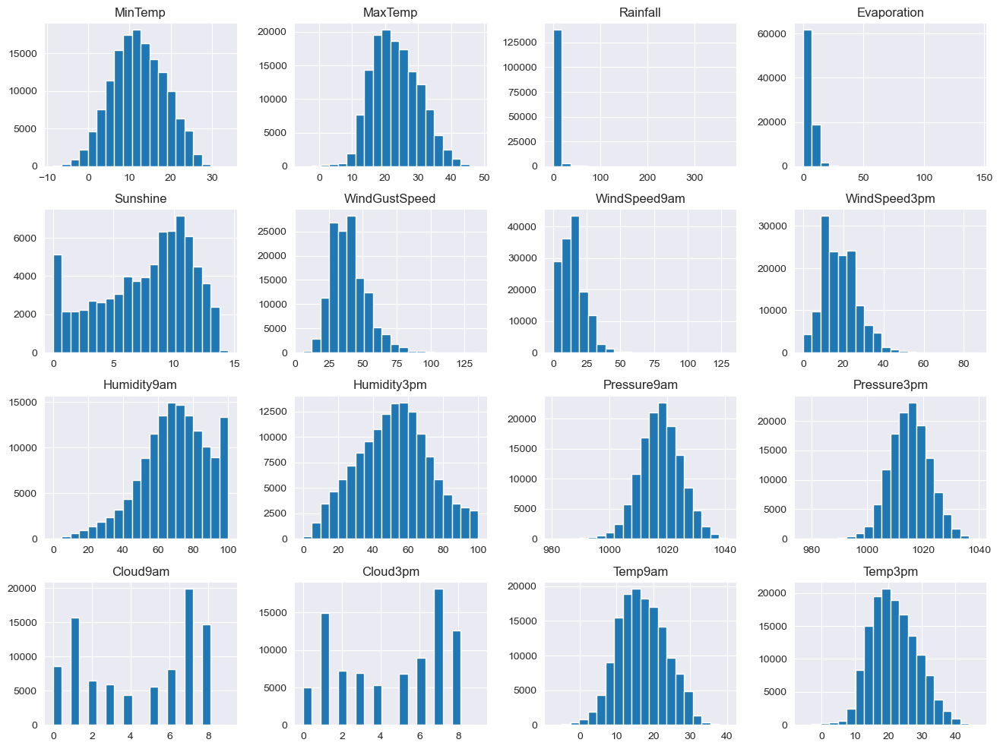

In [6]:
df.hist(figsize=(16,12), bins=20)
plt.show()

In [7]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

## Missing Values

In [8]:
def find_missing_values(df):
    df_nan = ((df.isnull().sum()/df.shape[0])*100).sort_values(ascending=True)
    df_miss = df_nan[df_nan > 0]
    return df_miss

In [9]:
def plot_missing_values(df_miss):
    df_miss.plot(kind='bar', figsize=(7,3), title='Missing Values')
    plt.ylabel("Percentage")
    plt.show()
    return None

In [10]:
df_miss = find_missing_values(df)

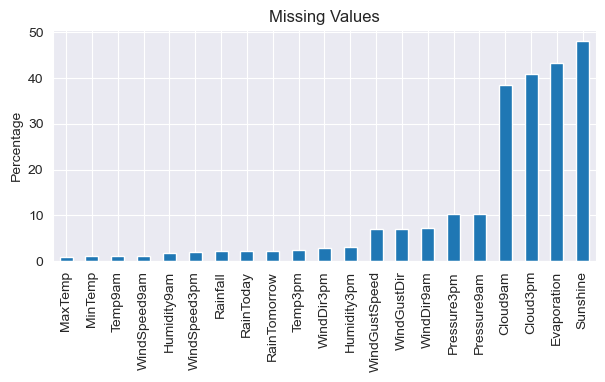

In [11]:
plot_missing_values(df_miss)

### Categorial and Numeric Dataset

In [12]:
num_cols = [col for col in df.columns if df[col].dtypes!='object']
cat_cols = [col for col in df.columns if df[col].dtypes=='object']

In [13]:
df_num = df[num_cols]
df_cat = df[cat_cols]

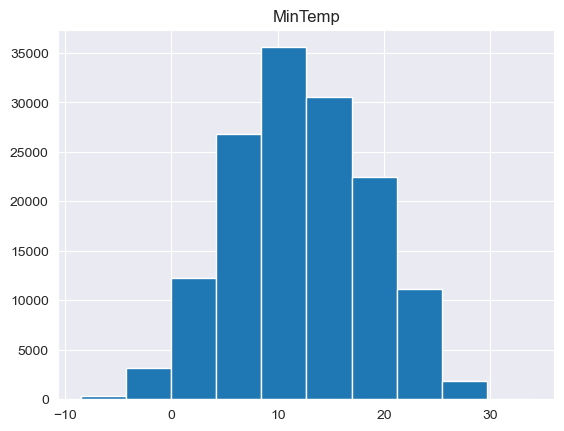

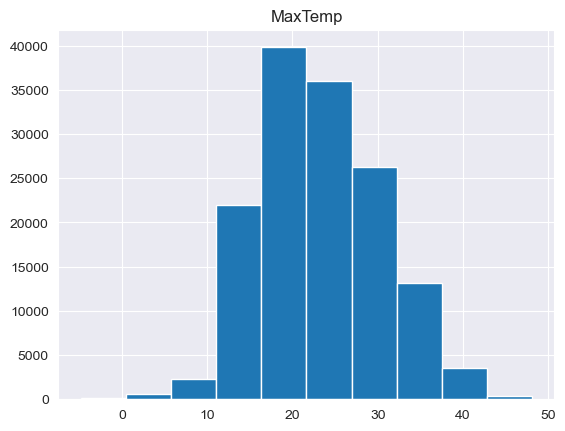

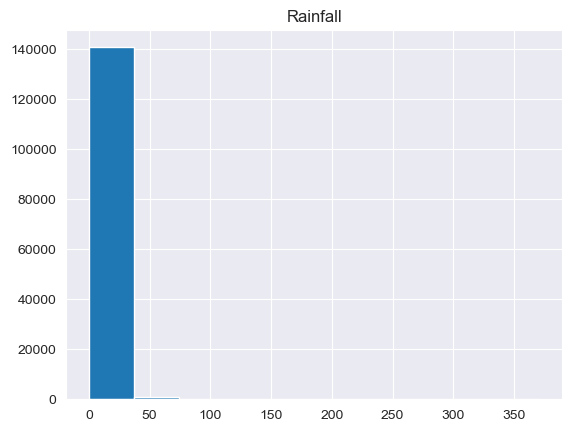

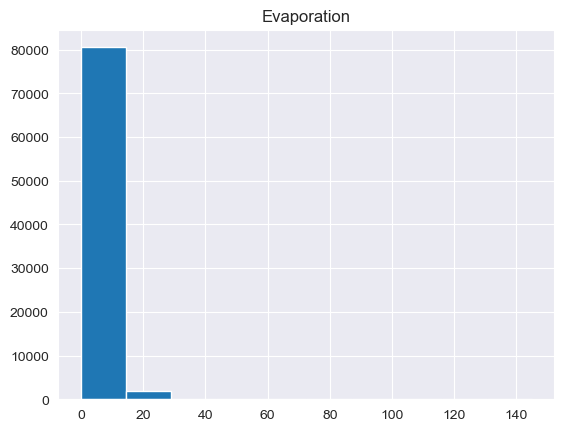

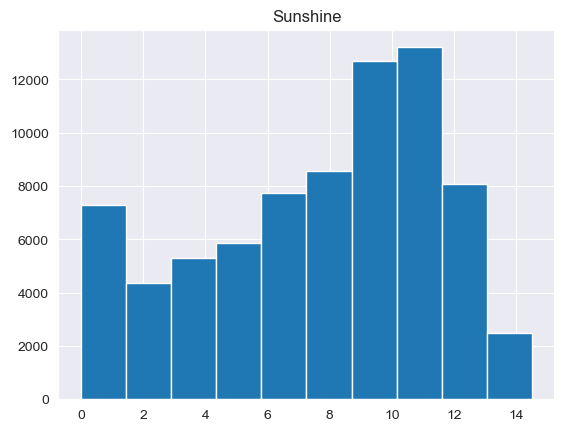

...

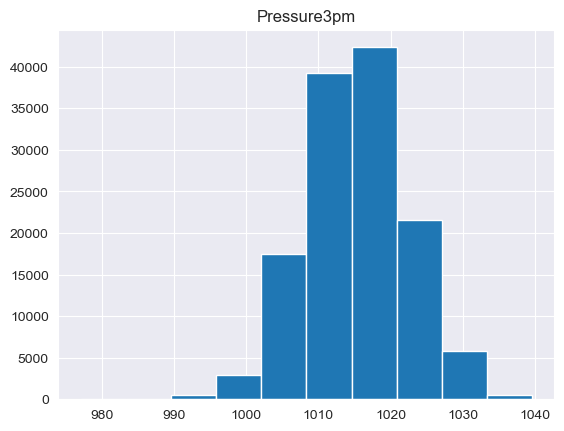

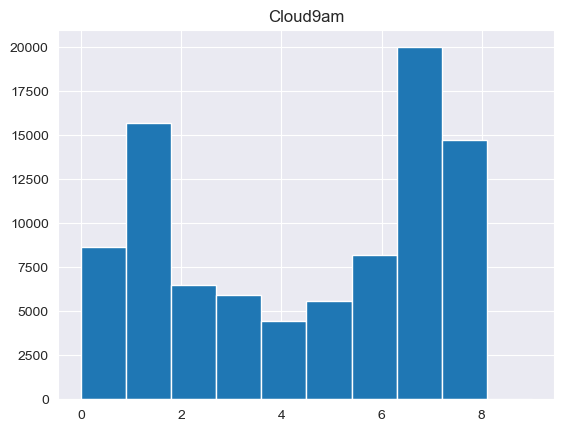

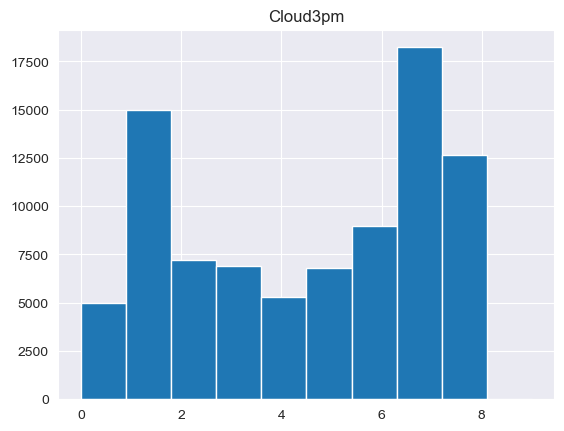

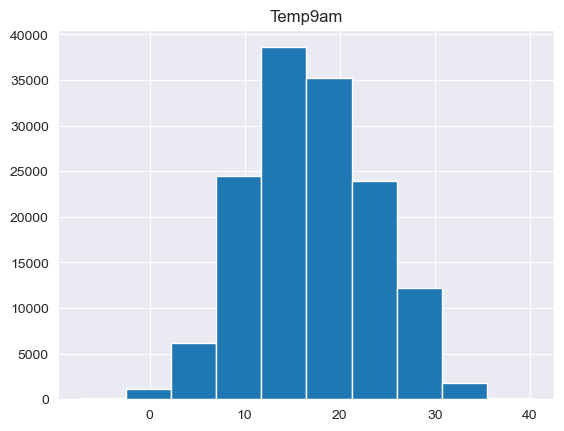

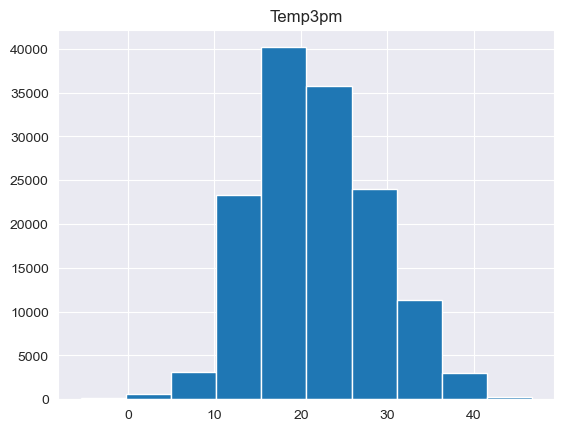

In [14]:
for col in df_num.columns:
    plt.hist(df_num[col])
    plt.title(col)
    plt.show()

In [15]:
df['RainTomorrow'].value_counts(dropna=True)

No     110316
Yes     31877
Name: RainTomorrow, dtype: int64

<AxesSubplot:ylabel='RainTomorrow'>

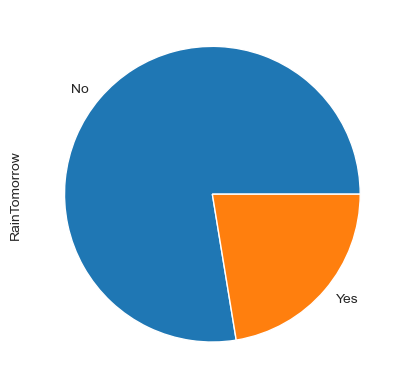

In [16]:
df['RainTomorrow'].value_counts(dropna=True).plot.pie()

In [17]:
df_num

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2.8,23.4,0.0,NaN,NaN,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4
145456,3.6,25.3,0.0,NaN,NaN,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5
145457,5.4,26.9,0.0,NaN,NaN,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1
145458,7.8,27.0,0.0,NaN,NaN,28.0,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0


In [18]:
df.describe().T.style.background_gradient(cmap='viridis')

,count,mean,std,min,25%,50%,75%,max
MinTemp,143975.000000,12.194034,6.398495,-8.500000,7.600000,12.000000,16.900000,33.900000
MaxTemp,144199.000000,23.221348,7.119049,-4.800000,17.900000,22.600000,28.200000,48.100000
Rainfall,142199.000000,2.360918,8.478060,0.000000,0.000000,0.000000,0.800000,371.000000
Evaporation,82670.000000,5.468232,4.193704,0.000000,2.600000,4.800000,7.400000,145.000000
Sunshine,75625.000000,7.611178,3.785483,0.000000,4.800000,8.400000,10.600000,14.500000
WindGustSpeed,135197.000000,40.035230,13.607062,6.000000,31.000000,39.000000,48.000000,135.000000
WindSpeed9am,143693.000000,14.043426,8.915375,0.000000,7.000000,13.000000,19.000000,130.000000
WindSpeed3pm,142398.000000,18.662657,8.809800,0.000000,13.000000,19.000000,24.000000,87.000000
Humidity9am,142806.000000,68.880831,19.029164,0.000000,57.000000,70.000000,83.000000,100.000000
Humidity3pm,140953.000000,51.539116,20.795902,0.000000,37.000000,52.000000,66.000000,100.000000


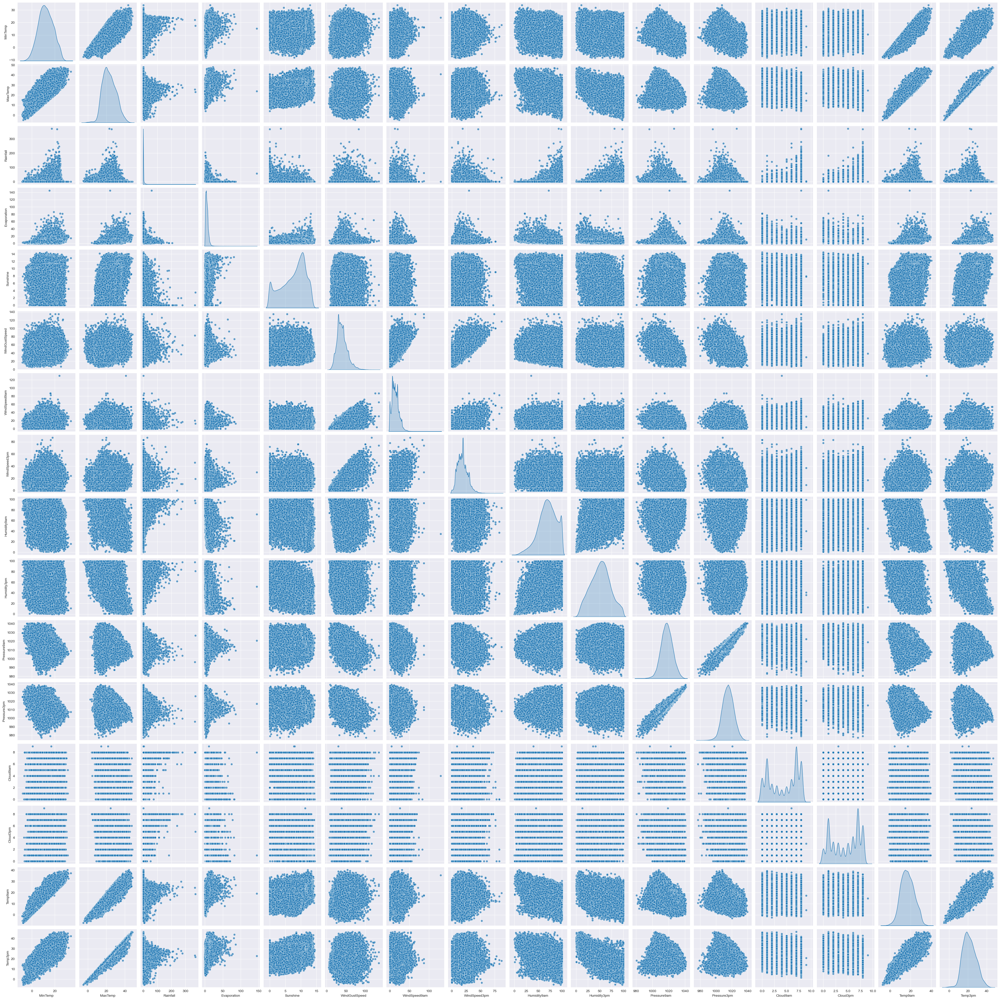

In [19]:
sns.pairplot(df_num, kind="scatter", diag_kind="kde", palette="muted", plot_kws={'alpha':0.7})
plt.show()

In [20]:
df_miss.index

Index(['MaxTemp', 'MinTemp', 'Temp9am', 'WindSpeed9am', 'Humidity9am',
       'WindSpeed3pm', 'Rainfall', 'RainToday', 'RainTomorrow', 'Temp3pm',
       'WindDir3pm', 'Humidity3pm', 'WindGustSpeed', 'WindGustDir',
       'WindDir9am', 'Pressure3pm', 'Pressure9am', 'Cloud9am', 'Cloud3pm',
       'Evaporation', 'Sunshine'],
      dtype='object')

In [21]:
df[['MaxTemp', 'MinTemp', 'Temp9am', 'WindSpeed9am']] = df[['MaxTemp', 'MinTemp', 'Temp9am', 'WindSpeed9am']]

In [22]:
list_col1 = ['MaxTemp', 'MinTemp', 'Temp9am', 'WindSpeed9am']
for col in list_col1:
    df.loc[df[col].isnull().index, col] = df[col].mean()

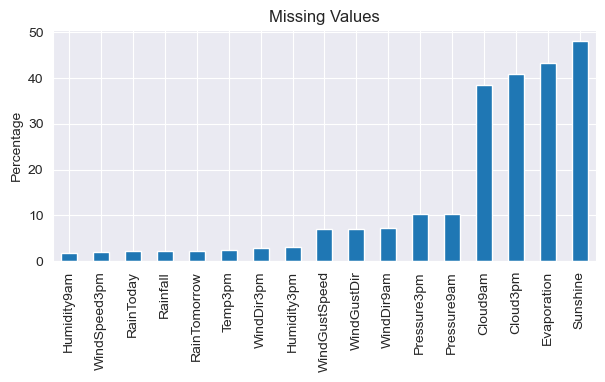

In [23]:
df_miss = find_missing_values(df)
plot_missing_values(df_miss)

In [24]:
df_miss.index

Index(['Humidity9am', 'WindSpeed3pm', 'RainToday', 'Rainfall', 'RainTomorrow',
       'Temp3pm', 'WindDir3pm', 'Humidity3pm', 'WindGustSpeed', 'WindGustDir',
       'WindDir9am', 'Pressure3pm', 'Pressure9am', 'Cloud9am', 'Cloud3pm',
       'Evaporation', 'Sunshine'],
      dtype='object')

In [25]:
df[['Humidity9am', 'WindSpeed3pm', 'Rainfall', 'Temp3pm']]

,Humidity9am,WindSpeed3pm,Rainfall,Temp3pm
0,71.0,24.0,0.6,21.8
1,44.0,22.0,0.0,24.3
2,38.0,26.0,0.0,23.2
3,45.0,9.0,0.0,26.5
4,82.0,20.0,1.0,29.7
...,...,...,...,...
145455,51.0,11.0,0.0,22.4
145456,56.0,9.0,0.0,24.5
145457,53.0,9.0,0.0,26.1
145458,51.0,7.0,0.0,26.0


In [26]:
list_col2 = ['Humidity9am', 'WindSpeed3pm', 'Rainfall', 'Temp3pm']
for col in list_col2:
    df.loc[df[col].isnull().index, col] = df[col].mean()

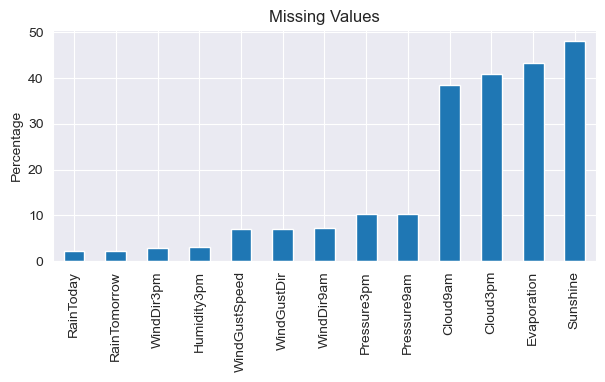

In [27]:
df_miss = find_missing_values(df)
plot_missing_values(df_miss)

In [28]:
df_miss.index

Index(['RainToday', 'RainTomorrow', 'WindDir3pm', 'Humidity3pm',
       'WindGustSpeed', 'WindGustDir', 'WindDir9am', 'Pressure3pm',
       'Pressure9am', 'Cloud9am', 'Cloud3pm', 'Evaporation', 'Sunshine'],
      dtype='object')

In [29]:
df[['Humidity3pm', 'Humidity3pm', 'WindGustSpeed', 'Pressure3pm','Pressure9am']]

,Humidity3pm,Humidity3pm,WindGustSpeed,Pressure3pm,Pressure9am
0,22.0,22.0,44.0,1007.1,1007.7
1,25.0,25.0,44.0,1007.8,1010.6
2,30.0,30.0,46.0,1008.7,1007.6
3,16.0,16.0,24.0,1012.8,1017.6
4,33.0,33.0,41.0,1006.0,1010.8
...,...,...,...,...,...
145455,24.0,24.0,31.0,1020.3,1024.6
145456,21.0,21.0,22.0,1019.1,1023.5
145457,24.0,24.0,37.0,1016.8,1021.0
145458,24.0,24.0,28.0,1016.5,1019.4


In [30]:
list_cols3 = ['Humidity3pm', 'Humidity3pm', 'WindGustSpeed', 'Pressure3pm','Pressure9am']
for col in list_cols3:
    df.loc[df[col].isnull().index, col] = df[col].median()

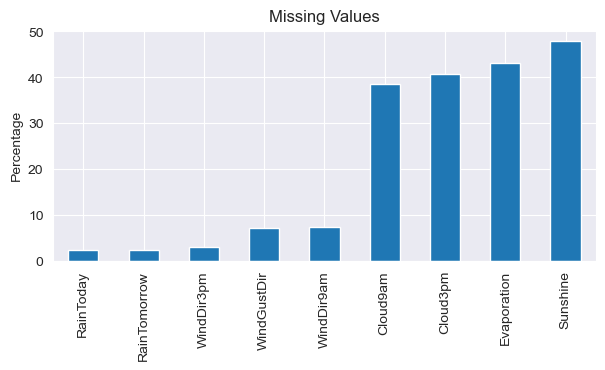

In [31]:
df_miss = find_missing_values(df)
plot_missing_values(df_miss)

In [32]:
df[df_miss.index]

,RainToday,RainTomorrow,WindDir3pm,WindGustDir,WindDir9am,Cloud9am,Cloud3pm,Evaporation,Sunshine
0,No,No,WNW,W,W,8.0,NaN,NaN,NaN
1,No,No,WSW,WNW,NNW,NaN,NaN,NaN,NaN
2,No,No,WSW,WSW,W,NaN,2.0,NaN,NaN
3,No,No,E,NE,SE,NaN,NaN,NaN,NaN
4,No,No,NW,W,ENE,7.0,8.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
145455,No,No,ENE,E,SE,NaN,NaN,NaN,NaN
145456,No,No,N,NNW,SE,NaN,NaN,NaN,NaN
145457,No,No,WNW,N,SE,NaN,NaN,NaN,NaN
145458,No,No,N,SE,SSE,3.0,2.0,NaN,NaN


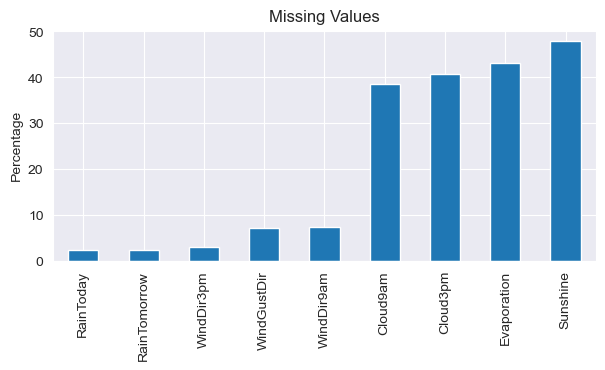

In [33]:
df_miss = find_missing_values(df)
plot_missing_values(df_miss)

In [34]:
df['Cloud3pm'].isnull().sum()

59358

In [35]:
df[df['Cloud3pm'].isnull()].index

Int64Index([     0,      1,      3,      5,      6,      7,      8,      9,
                10,     14,
            ...
            145447, 145448, 145449, 145450, 145451, 145453, 145454, 145455,
            145456, 145457],
           dtype='int64', length=59358)

In [36]:
df['Cloud3pm'] = df.groupby(['WindDir3pm'], dropna=False)['Cloud3pm'].transform(lambda x: x.fillna(x.median()))

In [37]:
df['Cloud3pm'].value_counts(dropna=False)

5.0    39706
6.0    23466
7.0    18229
4.0    17301
1.0    14976
8.0    12660
2.0     7226
3.0     6921
0.0     4974
9.0        1
Name: Cloud3pm, dtype: int64

In [38]:
df[['RainToday', 'RainTomorrow']].value_counts(dropna=False)

RainToday  RainTomorrow
No         No              92728
Yes        No              16858
No         Yes             16604
Yes        Yes             14597
NaN        NaN              1855
No         NaN               987
NaN        No                730
           Yes               676
Yes        NaN               425
dtype: int64

In [39]:
df['RainToday'] = df.groupby('WindDir3pm', dropna=False)['RainToday'].transform(lambda x: x.fillna(x.mode()[0])) 

In [40]:
df['RainToday'].value_counts(dropna=False)

No     113580
Yes     31880
Name: RainToday, dtype: int64

In [41]:
df['RainTomorrow'] = df.groupby('WindDir3pm', dropna=False)['RainTomorrow'].transform(lambda x: x.fillna(x.mode()[0])) 

In [42]:
df['RainTomorrow'].value_counts(dropna=False)

No     113583
Yes     31877
Name: RainTomorrow, dtype: int64

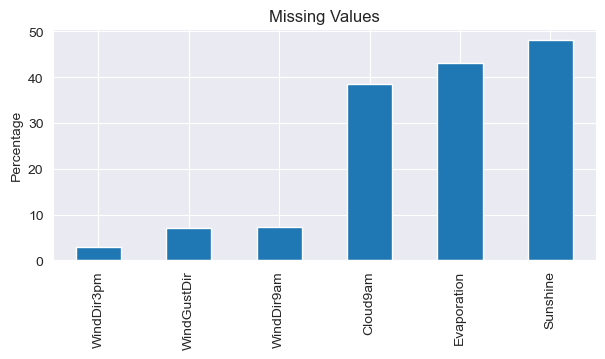

In [43]:
df_miss = find_missing_values(df)
plot_missing_values(df_miss)

In [44]:
df_miss.index

Index(['WindDir3pm', 'WindGustDir', 'WindDir9am', 'Cloud9am', 'Evaporation',
       'Sunshine'],
      dtype='object')

In [45]:
df['WindDir3pm']

0         WNW
1         WSW
2         WSW
3           E
4          NW
         ... 
145455    ENE
145456      N
145457    WNW
145458      N
145459    ESE
Name: WindDir3pm, Length: 145460, dtype: object

In [46]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,12.194034,23.221348,2.360918,NaN,NaN,W,39.0,W,...,68.880831,52.0,1017.6,1015.2,8.0,5.0,16.990631,21.68339,No,No
1,2008-12-02,Albury,12.194034,23.221348,2.360918,NaN,NaN,WNW,39.0,NNW,...,68.880831,52.0,1017.6,1015.2,NaN,5.0,16.990631,21.68339,No,No
2,2008-12-03,Albury,12.194034,23.221348,2.360918,NaN,NaN,WSW,39.0,W,...,68.880831,52.0,1017.6,1015.2,NaN,2.0,16.990631,21.68339,No,No
3,2008-12-04,Albury,12.194034,23.221348,2.360918,NaN,NaN,NE,39.0,SE,...,68.880831,52.0,1017.6,1015.2,NaN,4.0,16.990631,21.68339,No,No
4,2008-12-05,Albury,12.194034,23.221348,2.360918,NaN,NaN,W,39.0,ENE,...,68.880831,52.0,1017.6,1015.2,7.0,8.0,16.990631,21.68339,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,12.194034,23.221348,2.360918,NaN,NaN,E,39.0,SE,...,68.880831,52.0,1017.6,1015.2,NaN,4.0,16.990631,21.68339,No,No
145456,2017-06-22,Uluru,12.194034,23.221348,2.360918,NaN,NaN,NNW,39.0,SE,...,68.880831,52.0,1017.6,1015.2,NaN,6.0,16.990631,21.68339,No,No
145457,2017-06-23,Uluru,12.194034,23.221348,2.360918,NaN,NaN,N,39.0,SE,...,68.880831,52.0,1017.6,1015.2,NaN,5.0,16.990631,21.68339,No,No
145458,2017-06-24,Uluru,12.194034,23.221348,2.360918,NaN,NaN,SE,39.0,SSE,...,68.880831,52.0,1017.6,1015.2,3.0,2.0,16.990631,21.68339,No,No


In [47]:
df['WindDir3pm'] = df.groupby(['MinTemp','MaxTemp'], dropna=False)['WindDir3pm'].transform(lambda x: x.fillna(x.mode()[0]))

In [48]:
df[df['WindDir3pm'].isnull()]['WindDir3pm'].index

Int64Index([], dtype='int64')

In [49]:
df['WindGustDir'] = df.groupby(['MinTemp','MaxTemp'], dropna=False)['WindGustDir'].transform(lambda x: x.fillna(x.mode()[0]))

In [50]:
df[df['WindDir9am'].isnull()].index

Int64Index([    15,     26,     65,     86,     88,     95,    102,    110,
               112,    115,
            ...
            145089, 145090, 145091, 145110, 145120, 145130, 145169, 145323,
            145422, 145429],
           dtype='int64', length=10566)

In [51]:
df['WindDir9am'] = df.groupby(['MinTemp','MaxTemp'], dropna=False)['WindDir9am'].transform(lambda x: x.fillna(x.mode()[0]))

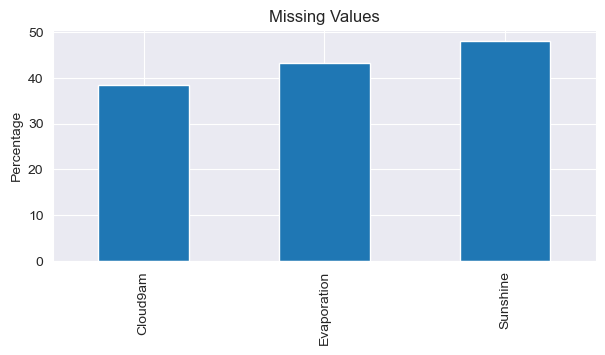

Cloud9am       38.421559
Evaporation    43.166506
Sunshine       48.009762
dtype: float64

In [52]:
df_miss = find_missing_values(df)
plot_missing_values(df_miss)
df_miss

In [53]:
df_miss.index

Index(['Cloud9am', 'Evaporation', 'Sunshine'], dtype='object')

In [54]:
df['Cloud9am'].value_counts(dropna=False)

NaN    55888
7.0    19972
1.0    15687
8.0    14697
0.0     8642
6.0     8171
2.0     6500
3.0     5914
5.0     5567
4.0     4420
9.0        2
Name: Cloud9am, dtype: int64

In [55]:
df['Cloud9am'] = df.groupby(['WindDir9am'], dropna=False)['Cloud9am'].transform(lambda x: x.fillna(x.median()))

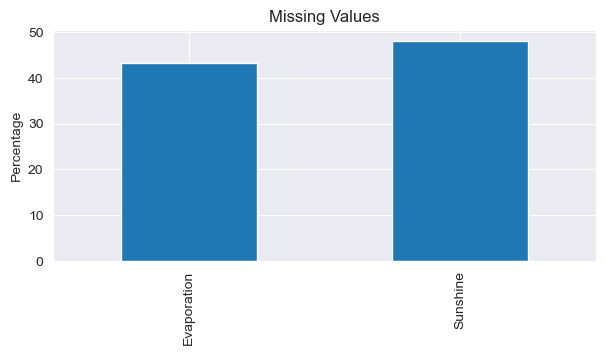

Evaporation    43.166506
Sunshine       48.009762
dtype: float64

In [56]:
df_miss = find_missing_values(df)
plot_missing_values(df_miss)
df_miss

In [57]:
df['Evaporation'].value_counts(dropna=False)

NaN     62790
4.0      3339
8.0      2609
2.2      2095
2.0      2032
        ...  
22.1        1
44.4        1
60.2        1
44.0        1
39.6        1
Name: Evaporation, Length: 359, dtype: int64

In [58]:
df['Evaporation'] = df.groupby(['WindDir9am'], dropna=False)['Evaporation'].transform(lambda x: x.fillna(x.median()))

In [59]:
df['Sunshine'].value_counts(dropna=False)

NaN     69835
0.0      2359
10.7     1101
11.0     1094
10.8     1069
        ...  
14.0       15
14.1        6
14.3        4
14.2        2
14.5        1
Name: Sunshine, Length: 146, dtype: int64

In [60]:
df['Sunshine'] = df.groupby(['WindDir9am'], dropna=False)['Sunshine'].transform(lambda x: x.fillna(x.mean()))

In [61]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

# Feature Engineering

In [62]:
df['Date'] = pd.to_datetime(df['Date'])

In [63]:
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['WeekOfDay'] = df['Date'].dt.isocalendar().week
df['Day'] = df['Date'].dt.day

In [64]:
df.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,WeekOfDay,Day
0,2008-12-01,Albury,12.194034,23.221348,2.360918,3.8,7.081882,W,39.0,W,...,8.0,5.0,16.990631,21.68339,No,No,2008,12,49,1
1,2008-12-02,Albury,12.194034,23.221348,2.360918,3.6,6.829854,WNW,39.0,NNW,...,6.0,5.0,16.990631,21.68339,No,No,2008,12,49,2
2,2008-12-03,Albury,12.194034,23.221348,2.360918,3.8,7.081882,WSW,39.0,W,...,6.0,2.0,16.990631,21.68339,No,No,2008,12,49,3


In [65]:
df = df.drop('Date', axis=1)

In [66]:
num_cols = [col for col in df.columns if df[col].dtypes!='object']
cat_cols = [col for col in df.columns if df[col].dtypes=='object']

In [67]:
df_num = df[num_cols]
df_cat = df[cat_cols]

In [68]:
df_num

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,WeekOfDay,Day
0,12.194034,23.221348,2.360918,3.8,7.081882,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,8.0,5.0,16.990631,21.68339,2008,12,49,1
1,12.194034,23.221348,2.360918,3.6,6.829854,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,6.0,5.0,16.990631,21.68339,2008,12,49,2
2,12.194034,23.221348,2.360918,3.8,7.081882,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,6.0,2.0,16.990631,21.68339,2008,12,49,3
3,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,5.0,4.0,16.990631,21.68339,2008,12,49,4
4,12.194034,23.221348,2.360918,5.8,8.797557,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,7.0,8.0,16.990631,21.68339,2008,12,49,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,5.0,4.0,16.990631,21.68339,2017,6,25,21
145456,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,5.0,6.0,16.990631,21.68339,2017,6,25,22
145457,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,5.0,5.0,16.990631,21.68339,2017,6,25,23
145458,12.194034,23.221348,2.360918,5.8,7.810928,39.0,14.043426,18.662657,68.880831,52.0,1017.6,1015.2,3.0,2.0,16.990631,21.68339,2017,6,25,24


In [69]:
df_cat.head()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,Albury,W,W,WNW,No,No
1,Albury,WNW,NNW,WSW,No,No
2,Albury,WSW,W,WSW,No,No
3,Albury,NE,SE,E,No,No
4,Albury,W,ENE,NW,No,No


In [70]:
df = df.drop('Location', axis=1)

In [71]:
df_cat.loc[df_cat['RainTomorrow']=='Yes', 'RainTomorrow'] = 1
df_cat.loc[df_cat['RainTomorrow']=='No', 'RainTomorrow'] = 0


df_cat.loc[df_cat['RainToday']=='Yes', 'RainToday'] = 1
df_cat.loc[df_cat['RainToday']=='No', 'RainToday'] = 0

In [72]:
df_cat.head(3)

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,Albury,W,W,WNW,0,0
1,Albury,WNW,NNW,WSW,0,0
2,Albury,WSW,W,WSW,0,0


In [73]:
df_cat = df_cat.drop('Location', axis=1)

In [74]:
df_cat.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,W,W,WNW,0,0
1,WNW,NNW,WSW,0,0
2,WSW,W,WSW,0,0
3,NE,SE,E,0,0
4,W,ENE,NW,0,0


In [75]:
df_cat.columns

Index(['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow'], dtype='object')

In [76]:
df_cat_wind = pd.get_dummies(df_cat[['WindGustDir', 'WindDir9am', 'WindDir3pm']])
df_cat_wind

,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
145456,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
145457,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
145458,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [77]:
df_final = pd.concat([df_num, df_cat_wind, df_cat[['RainToday', 'RainTomorrow']]], axis=1)

In [78]:
df_final

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday,RainTomorrow
0,12.194034,23.221348,2.360918,3.8,7.081882,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,1,0,0,0
1,12.194034,23.221348,2.360918,3.6,6.829854,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,0,1,0,0
2,12.194034,23.221348,2.360918,3.8,7.081882,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,0,1,0,0
3,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,0,0,0,0
4,12.194034,23.221348,2.360918,5.8,8.797557,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,0,0,0,0
145456,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,0,0,0,0
145457,12.194034,23.221348,2.360918,6.2,8.398349,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,1,0,0,0
145458,12.194034,23.221348,2.360918,5.8,7.810928,39.0,14.043426,18.662657,68.880831,52.0,...,0,0,0,0,0,0,0,0,0,0


In [79]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [131]:
X = df_final.drop('RainTomorrow', axis=1)
y = df_final['RainTomorrow'].astype('int')

In [132]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_train = pd.DataFrame(X_train_scaled, columns=X.columns)

X_test_scaled = scaler.transform(X_test)
X_test = pd.DataFrame(X_test_scaled, columns=X.columns)

In [133]:
X_test.shape

(43638, 69)

In [134]:
y_train.shape

(101822,)

In [135]:
y_test.shape

(43638,)

In [136]:
X_train

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday
0,3.552714e-15,-1.065814e-14,-8.881784e-16,-0.087897,-0.109677,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,-0.340091,-0.264782,4.082299,-0.261625,-0.272868,-0.254569,-0.263932,-0.528290
1,3.552714e-15,-1.065814e-14,-8.881784e-16,-0.149411,0.195418,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,-0.340091,-0.264782,-0.244960,-0.261625,-0.272868,-0.254569,3.788859,-0.528290
2,3.552714e-15,-1.065814e-14,-8.881784e-16,0.342696,0.387076,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,2.940389,-0.264782,-0.244960,-0.261625,-0.272868,-0.254569,-0.263932,-0.528290
3,3.552714e-15,-1.065814e-14,-8.881784e-16,1.019343,1.712790,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,-0.340091,-0.264782,-0.244960,-0.261625,-0.272868,-0.254569,-0.263932,-0.528290
4,3.552714e-15,-1.065814e-14,-8.881784e-16,-0.026384,1.243127,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,-0.340091,3.776689,-0.244960,-0.261625,-0.272868,-0.254569,-0.263932,-0.528290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101817,3.552714e-15,-1.065814e-14,-8.881784e-16,-0.333951,0.881848,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,-0.340091,-0.264782,-0.244960,-0.261625,-0.272868,-0.254569,-0.263932,-0.528290
101818,3.552714e-15,-1.065814e-14,-8.881784e-16,-0.580004,0.303801,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,2.940389,-0.264782,-0.244960,-0.261625,-0.272868,-0.254569,-0.263932,1.892899
101819,3.552714e-15,-1.065814e-14,-8.881784e-16,-0.333951,-0.137043,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,-0.340091,-0.264782,-0.244960,3.822262,-0.272868,-0.254569,-0.263932,1.892899
101820,3.552714e-15,-1.065814e-14,-8.881784e-16,0.096643,-0.082419,0.0,7.105427e-15,0.0,-4.263256e-14,0.0,...,-0.253056,-0.26787,2.940389,-0.264782,-0.244960,-0.261625,-0.272868,-0.254569,-0.263932,1.892899


# Machine Learning

In [137]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score

## Model SVC

              precision    recall  f1-score   support

           0       0.81      0.97      0.88     34058
           1       0.65      0.22      0.33      9580

    accuracy                           0.80     43638
   macro avg       0.73      0.59      0.61     43638
weighted avg       0.78      0.80      0.76     43638



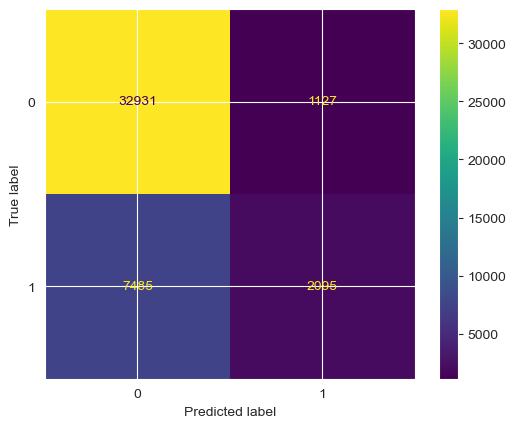

In [138]:
model_svc = SVC()
model_svc.fit(X_train, y_train)
y_pred_svc = model_svc.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred_svc))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_svc)

## DecisionTreeClassifier

              precision    recall  f1-score   support

           0       0.84      0.83      0.83     34058
           1       0.42      0.43      0.42      9580

    accuracy                           0.74     43638
   macro avg       0.63      0.63      0.63     43638
weighted avg       0.75      0.74      0.74     43638



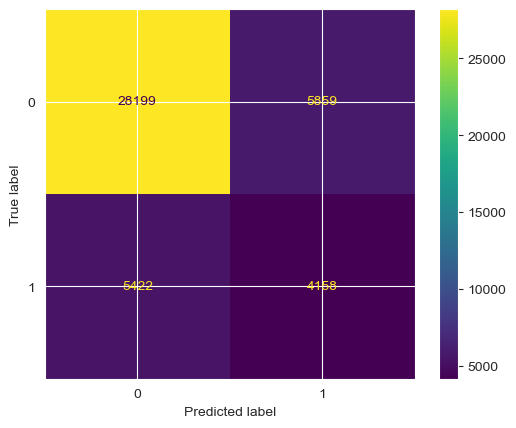

In [139]:
model_DT = DecisionTreeClassifier()
model_DT.fit(X_train, y_train)
y_pred_DT = model_DT.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred_DT))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_DT)

## Model KNeighborsClassifier

C:\Users\PC_Seraphin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


              precision    recall  f1-score   support

           0       0.82      0.92      0.87     34058
           1       0.49      0.26      0.34      9580

    accuracy                           0.78     43638
   macro avg       0.65      0.59      0.60     43638
weighted avg       0.74      0.78      0.75     43638



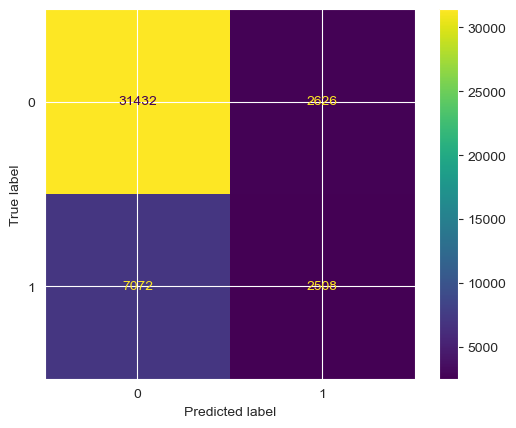

In [140]:
model_knn = KNeighborsClassifier()
model_knn.fit(X_train, y_train)
y_pred_knn = model_knn.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred_knn))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_knn)

## Model RandomForestClassifier

              precision    recall  f1-score   support

           0       0.83      0.95      0.89     34058
           1       0.63      0.32      0.42      9580

    accuracy                           0.81     43638
   macro avg       0.73      0.63      0.65     43638
weighted avg       0.79      0.81      0.78     43638



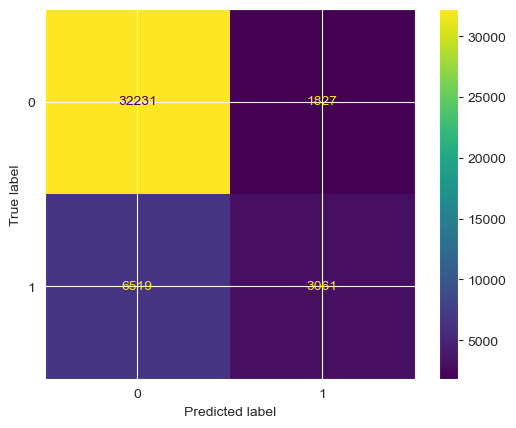

In [141]:
model_RDF = RandomForestClassifier()
model_RDF.fit(X_train, y_train)
y_pred_RDF = model_RDF.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred_RDF))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_RDF)

## Model GradientBoostingClassifier

              precision    recall  f1-score   support

           0       0.82      0.95      0.88     34058
           1       0.63      0.28      0.39      9580

    accuracy                           0.81     43638
   macro avg       0.73      0.62      0.64     43638
weighted avg       0.78      0.81      0.78     43638



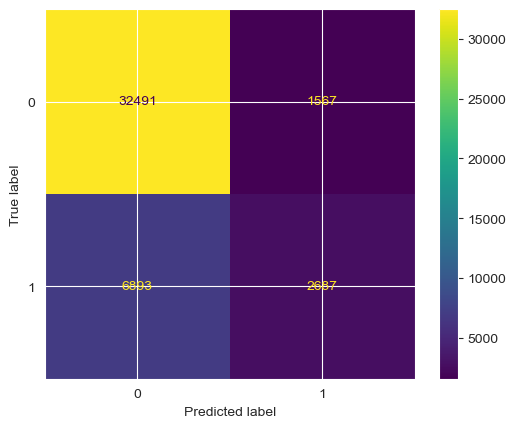

In [142]:
model_GBC = GradientBoostingClassifier()
model_GBC.fit(X_train, y_train)
y_pred_GBC = model_GBC.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred_GBC))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_GBC)

## Hyperparameter Tuning

#### SVC Tuning

In [143]:
# define model and parameters
model = SVC()
kernel = ['poly', 'rbf', 'sigmoid']
C = [10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel ,C=C ,gamma=gamma)
grid_svc = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=5, scoring='accuracy',error_score=0)
result_svc = grid_svc.fit(X, y)
# summarize results
print("Best: %f using %s" % (result_svc.best_score_, result_svc.best_params_))
means  = result_svc.cv_results_['mean_test_score']
stds   = result_svc.cv_results_['std_test_score']
params = result_svc.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.780854 using {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
0.780854 (0.000017) with: {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
0.780854 (0.000017) with: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.780854 (0.000017) with: {'C': 10, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.780854 (0.000017) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'poly'}
0.780854 (0.000017) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
0.780854 (0.000017) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.780854 (0.000017) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
0.780854 (0.000017) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.780854 (0.000017) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.780854 (0.000017) with: {'C': 0.01, 'gamma': 'scale', 'kernel': 'poly'}
0.780854 (0.000017) with: {'C': 0.01, 'gamma': 'scale', 'kernel': 'rbf'}
0.780854 (0.000017) with: {'C': 0.01, 'gamma': 'scale', 'kernel': 'sigmoid'}


## SVC model with hyperparamter Tuning

              precision    recall  f1-score   support

           0       0.81      0.97      0.88     34058
           1       0.65      0.22      0.32      9580

    accuracy                           0.80     43638
   macro avg       0.73      0.59      0.60     43638
weighted avg       0.78      0.80      0.76     43638



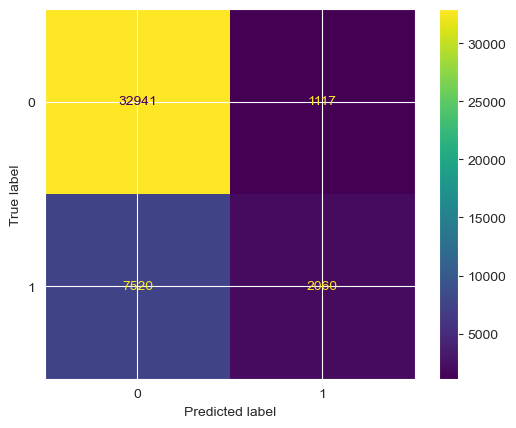

In [144]:
model_svc_tuned = SVC(C=1, gamma='scale', kernel='poly')
model_svc_tuned.fit(X_train, y_train)
y_pred_scv_tuned = model_svc_tuned.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred_scv_tuned))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_scv_tuned)